In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
import scanpy as sc
from scipy.spatial import Delaunay
from matplotlib.colors import Normalize, NoNorm, to_rgba, to_rgb, Colormap, ListedColormap

In [2]:
import squidpy as sq
import networkx as nx
from sklearn.metrics import pairwise_distances
import athena as ath
# import spatialHeterogeneity as sh
import re
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, Normalize
from scipy.stats import wilcoxon

In [3]:
from types import MappingProxyType
from matplotlib import pyplot as plt
from skimage import io as sk_io
from pathlib import Path
from typing import Any, Union, Optional  # Meta
from typing import Iterable, Sequence, Mapping, MutableMapping  # Generic ABCs
from typing import Tuple, List 
import matplotlib.colors as mcolors
import matplotlib.ticker as plticker
import matplotlib

In [4]:
# import spatialHeterogeneity as sh
# from matplotlib.colors import ListedColormap, Normalize
from matplotlib.colors import Normalize, NoNorm, to_rgba, to_rgb, Colormap, ListedColormap
from tqdm import tqdm
from matplotlib import cm
from spatialOmics import SpatialOmics
pd.set_option('display.max_columns', 20)

In [5]:
import os
os.environ['NUMEXPR_MAX_THREADS'] = '16'

In [6]:
# from spatialHeterogeneity.utils.general import is_numeric, is_categorical, make_iterable
# from spatialHeterogeneity.plotting.utils import dpi, label_fontdict, title_fontdict, make_cbar 
from athena.utils.general import is_numeric, is_categorical, make_iterable
from athena.plotting.utils import dpi, label_fontdict, title_fontdict, make_cbar

def custom_spatial(so, spl: str, attr: str, *, mode: str = 'scatter', node_size: float = 4, coordinate_keys: list = ['x', 'y'],
            mask_key: str = 'cellmasks', graph_key: str = 'knn', edges: bool = False, edge_width: float = .5,
            edge_color: str = 'black', edge_zorder: int = 2, background_color: str = 'white', ax: plt.Axes = None,
            norm=None, set_title: bool = True, cmap=None, cmap_labels: list = None, cbar: bool = True,
            cbar_title: bool = True, show: bool = True, save: str = None, tight_layout: bool = True):
    """Various functionalities to visualise samples.
    Allows to visualise the samples and color observations according to features in either so.X or so.obs by setting the ``attr`` parameter accordingly.
    Furthermore, observations (cells) within a sample can be quickly visualised using scatter plots (requires extraction of centroids with :func:`~.extract_centroids`)
    or by their actual segmentatio mask by setting ``mode`` accordingly.
    Finally, the graph representation of the sample can be overlayed by setting ``edges=True`` and specifing the ``graph_key`` as in ``so.G[spl][graph_key]``.
    For more examples on how to use this function have a look at the tutorial_ section.
    Args:
        so: SpatialOmics instance
        spl: sample to visualise
        attr: feature to visualise
        mode: {scatter, mask}. In `scatter` mode, observations are represented by their centroid, in `mask` mode by their actual segmentation mask
        node_size: size of the node when plotting the graph representation
        coordinate_keys: column names in SpatialOmics.obs[spl] that indicates the x and y coordinates
        mask_key: key for the segmentation masks when in `mask` mode
        graph_key: which graph representation to use
        edges: whether to plot the graph or not
        edge_width: width of edges
        edge_color: color of edges as string
        edge_zorder: z-order of edges
        background_color: background color of plot
        ax: axes object in which to plot
        norm: normalisation instance to normalise the values of `attr`
        set_title: title of plot
        cmap: colormap to use
        cmap_labels: colormap labels to use
        cbar: whether to plot a colorbar or not
        cbar_title: whether to plot the `attr` name as title of the colorbar
        show: whether to show the plot or not
        save: path to the file in which the plot is saved
        tight_layout: whether to apply tight_layout or not.
    Examples:
        .. code-block:: python
            so = sh.dataset.imc()
            sh.pl.spatial(so, 'slide_7_Cy2x2', 'meta_id', mode='mask')
            sh.pl.spatial(so, 'slide_7_Cy2x2', 'meta_id', mode='scatter', edges=True)
    .. _tutorial: https://ai4scr.github.io/ATHENA/source/tutorial.html
    """
    # get attribute information
    data = None  # pd.Series/array holding the attr for colormapping
    colors = None  # array holding the colormappig of data

    # try to fetch the attr data
    if attr:
        if attr in so.obs[spl].columns:
            data = so.obs[spl][attr]
        elif attr in so.X[spl].columns:
            data = so.X[spl][attr]
        else:
            raise KeyError(f'{attr} is not an column of X nor obs')
    else:
        colors = 'black'
        cmap = 'black'
        cbar = False

    # broadcast if necessary
    _is_categorical_flag = is_categorical(data)

    loc = so.obs[spl][coordinate_keys].copy()

    # set colormap
    if cmap is None:
        cmap, cmap_labels = get_cmap(so, attr, data)
    elif isinstance(cmap, str) and colors is None:
        cmap = plt.get_cmap(cmap)

    # normalisation
    if norm is None:
        if _is_categorical_flag:
            norm = NoNorm()
        else:
            norm = Normalize()

    # generate figure
    if ax:
        fig = ax.get_figure()
        show = False  # do not automatically show plot if we provide axes
    else:
        fig, ax = plt.subplots(dpi=dpi)
        ax.set_aspect('equal')

    # compute edge lines
    if edges:
        g = so.G[spl][graph_key]
        e = np.array(g.edges, dtype=type(loc.index.dtype))

        tmp1 = loc.loc[e.T[0]]
        tmp2 = loc.loc[e.T[1]]

        x = np.stack((tmp1[coordinate_keys[0]], tmp2[coordinate_keys[0]]))
        y = np.stack((tmp1[coordinate_keys[1]], tmp2[coordinate_keys[1]]))

        # we have to plot sequentially nodes and edges, this takes a bit longer but is more flexible
        im = ax.plot(x, y, linestyle='-', linewidth=edge_width, marker=None, color=edge_color, zorder=edge_zorder)

    # plot
    if mode == 'scatter':
        # convert data to numeric
        data = np.asarray(
            data) if data is not None else None  # categorical data does not work with cmap, therefore we construct an array
        _broadcast_to_numeric = not is_numeric(data)  # if data is now still categorical, map to numeric

        if _broadcast_to_numeric and data is not None:
            if attr in so.uns['cmap_labels']:
                cmap_labels = so.uns['cmap_labels'][attr]
                encoder = {value: key for key, value in cmap_labels.items()}  # invert to get encoder
#                 print(encoder)
            else:
                uniq = np.unique(data)
                encoder = {i: j for i, j in zip(uniq, range(len(uniq)))}
                cmap_labels = {value: key for key, value in encoder.items()}  # invert to get cmap_labels

            data = np.asarray([encoder[i] for i in data])

        # map to colors
        if colors is None:
            no_na = data[~np.isnan(data)]
            _ = norm(no_na)  # initialise norm with no NA data.

            colors = cmap(norm(data))
#             print('Check_point cmap2colors',colors)

        im = ax.scatter(loc[coordinate_keys[0]], loc[coordinate_keys[1]], s=node_size, c=colors, zorder=2.5)
        ax.set_facecolor(background_color)

    elif mode == 'mask':

        # get cell mask
        mask = so.get_mask(spl, mask_key)

        # generate mapping
        if data is not None:
            mapping = data.to_dict()
        elif colors:
            # case in which attr is a color
            uniq = np.unique(mask)
            uniq = uniq[uniq != 0]
            mapping = {i: j for i, j in zip(uniq, np.ones(len(uniq), dtype=int))}  # map everything to 1
            cmap = ListedColormap([to_rgba('white'), colors])
        else:
            raise RuntimeError('Unknown case')
        mapping.update({0: 0})
        mapping.update({np.nan: np.nan})

        # apply mapping vectorized
        otype = ['int'] if _is_categorical_flag else ['float']
        func = np.vectorize(lambda x: mapping[x], otypes=otype)
        im = func(mask)

        # convert to masked array to handle np.nan values
        im = np.ma.array(im, mask=np.isnan(im))

        # plot
        im = cmap(norm(im))
        im[mask == 0] = to_rgba(background_color)
        imobj = ax.imshow(im)
        ax.invert_yaxis()

    else:
        raise ValueError(f'Invalide plotting mode {mode}')

    # add colorbar
    if cbar:
        title = attr
        if cbar_title is False:
            title = ''
        make_cbar(ax, title, norm, cmap, cmap_labels)

    # format plot
    ax_pad = min(loc[coordinate_keys[0]].max() * .05, loc[coordinate_keys[1]].max() * .05, 10)
    ax.set_xlim(loc[coordinate_keys[0]].min() - 0.05, loc[coordinate_keys[0]].max() + 0.05)
    ax.set_ylim(loc[coordinate_keys[1]].min() - 0.05, loc[coordinate_keys[1]].max() + 0.05)
#     ax.legend(prop=dict(size=30))
#     ax.set_xticks([]);
#     ax.set_yticks([])
#     ax.set_xlabel('spatial x', label_fontdict)
#     ax.set_ylabel('spatial y', label_fontdict)
    ax.set_aspect(1)
    if set_title:
        title = f'{spl}' if cbar else f'{spl}, {attr}'
        ax.set_title(title, {'size': 15})

    if tight_layout:
        fig.tight_layout()

    if show:
        fig.show()

    if save:
        savefig(fig, save)
    

def get_cmap(so, attr: str, data):
    '''
    Return the cmap and cmap labels for a given attribute if available, else a default
    Parameters
    ----------
    so: IMCData
        so object form which to fetch the data
    spl: str
        spl for which to get data
    attr: str
        attribute for which to get the cmap and cmap labels if available
    Returns
    -------
    cmap and cmap labels for attribute
    '''

    # TODO: recycle cmap if more observations than colors
    cmap, cmap_labels = None, None
    if attr in so.uns['cmaps'].keys():
        cmap = so.uns['cmaps'][attr]
    elif is_categorical(data):
        cmap = so.uns['cmaps']['category']
    else:
        cmap = so.uns['cmaps']['default']

    if attr in so.uns['cmap_labels'].keys():
        cmap_labels = so.uns['cmap_labels'][attr]
#     print(cmap, cmap_labels)
    return cmap, cmap_labels

In [7]:
title_fontdict

{'size': 10}

In [8]:
pd.set_option('display.max_columns', None)
params = {'legend.fontsize': 20,
          'legend.handlelength': 2}
plt.rcParams.update(params)

In [9]:
path2sample = '../Input/COAD/samples.csv'
CELL_PATH = Path('/afm01/UQ/Q1851/Andrew/206_Hyperion_Colon/20-29_Analysis/22_Single_Cell_Analysis/206.22.01_Single_Cell_Data')


In [10]:
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS

GRAPH_BUILDER_DEFAULT_PARAMS


{'knn': {'builder_params': {'n_neighbors': 6,
   'mode': 'connectivity',
   'metric': 'minkowski',
   'p': 2,
   'metric_params': None,
   'include_self': True,
   'n_jobs': -1}},
 'contact': {'builder_params': {'dilation_kernel': 'disk',
   'radius': 4,
   'include_self': True}},
 'radius': {'builder_params': {'radius': 36,
   'mode': 'connectivity',
   'metric': 'minkowski',
   'p': 2,
   'metric_params': None,
   'include_self': True,
   'n_jobs': -1}}}

In [11]:
adata = sc.read_h5ad(CELL_PATH.joinpath('20220215_COAD_cancer_control_umapped_annotated.h5ad'))

In [12]:
adata.obs

,ImageNumber,ObjectNumber,AreaShape_Area,AreaShape_BoundingBoxArea,AreaShape_BoundingBoxMaximum_X,AreaShape_BoundingBoxMaximum_Y,AreaShape_BoundingBoxMinimum_X,AreaShape_BoundingBoxMinimum_Y,AreaShape_Center_X,AreaShape_Center_Y,AreaShape_Compactness,AreaShape_ConvexArea,AreaShape_Eccentricity,AreaShape_EquivalentDiameter,AreaShape_EulerNumber,AreaShape_Extent,AreaShape_FormFactor,AreaShape_MajorAxisLength,AreaShape_MaxFeretDiameter,AreaShape_MaximumRadius,AreaShape_MeanRadius,AreaShape_MedianRadius,AreaShape_MinFeretDiameter,AreaShape_MinorAxisLength,AreaShape_Orientation,AreaShape_Perimeter,AreaShape_Solidity,Count_cell,FileName_FullStack,FileName_cellmask,Metadata_description,Metadata_slideid,Metadata_acname,Metadata_acid,batch,alt_identifier,Metadata,image_index,n_genes,leiden,cell_type
0_1_1,1,1,79,128,47,8,31,0,38.759494,2.405063,1.330926,85,0.846004,10.029253,1,0.617188,0.751357,14.781388,15.033296,4.000000,1.726462,1.414214,7.000000,7.881101,88.760650,36.349242,0.929412,6537.0,030520 ad 24 p53_s0_a1_ac_full.tiff,030520 ad 24 p53_s0_a1_ac_ilastik_s2_Probabili...,ROI_001,0,030520 ad 24 p53 CR077,1,Cancer,CR077,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,0,13,8,Stromal
0_1_2,1,2,30,40,140,8,135,0,136.866667,3.833333,1.086934,34,0.859845,6.180387,1,0.750000,0.920019,8.956875,7.615773,2.000000,1.308088,1.000000,3.945576,4.572982,2.751915,20.242641,0.882353,6537.0,030520 ad 24 p53_s0_a1_ac_full.tiff,030520 ad 24 p53_s0_a1_ac_ilastik_s2_Probabili...,ROI_001,0,030520 ad 24 p53 CR077,1,Cancer,CR077,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,0,14,2,CD8 T cell
0_1_3,1,3,158,252,240,14,222,0,230.208861,5.607595,1.351374,179,0.788910,14.183506,1,0.626984,0.739987,18.642114,18.867962,5.656854,2.334285,2.000000,11.400000,11.455740,-53.051651,51.798990,0.882682,6537.0,030520 ad 24 p53_s0_a1_ac_full.tiff,030520 ad 24 p53_s0_a1_ac_ilastik_s2_Probabili...,ROI_001,0,030520 ad 24 p53 CR077,1,Cancer,CR077,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,0,15,13,Stromal
0_1_4,1,4,102,192,257,12,241,0,249.588235,5.323529,1.638987,136,0.781221,11.396071,1,0.531250,0.610133,16.038923,16.155494,4.123106,1.827315,1.414214,11.000000,10.012380,70.525473,45.834524,0.750000,6537.0,030520 ad 24 p53_s0_a1_ac_full.tiff,030520 ad 24 p53_s0_a1_ac_ilastik_s2_Probabili...,ROI_001,0,030520 ad 24 p53 CR077,1,Cancer,CR077,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,0,15,18,Proliferative Tumor
0_1_5,1,5,62,78,299,6,286,0,291.854839,2.112903,1.222649,67,0.879306,8.884866,1,0.794872,0.817896,13.244368,12.165525,3.000000,1.638940,1.414214,5.000000,6.307738,-83.849459,30.863961,0.925373,6537.0,030520 ad 24 p53_s0_a1_ac_full.tiff,030520 ad 24 p53_s0_a1_ac_ilastik_s2_Probabili...,ROI_001,0,030520 ad 24 p53 CR077,1,Cancer,CR077,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,0,15,22,Stromal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169_7_3767,7,3767,27,40,638,746,628,742,631.925926,743.777778,1.025896,32,0.911248,5.863230,1,0.675000,0.974758,9.563463,9.486833,2.000000,1.231209,1.000000,3.000000,3.938797,79.216137,18.656854,0.843750,3774.0,CR202_s0_a3_ac_full.tiff,CR202_s0_a3_ac_ilastik_s2_normal_Probabilities...,ROI_003,0,CR202,3,Control,CR202,Normal CR202_s0_a3_ac_full.tiff,169,13,6,Macrophages
169_7_3768,7,3768,47,84,107,750,95,743,101.106383,746.617021,1.397336,52,0.918026,7.735778,1,0.559524,0.715648,12.645361,12.529964,3.000000,1.422348,1.000000,5.059644,5.014128,-64.896477,28.727922,0.903846,3774.0,CR202_s0_a3_ac_full.tiff,CR202_s0_a3_ac_ilastik_s2_normal_Probabilities...,ROI_003,0,CR202,3,Control,CR202,Normal CR202_s0_a3_ac_full.tiff,169,15,13,Stromal
169_7_3769,7,3769,34,48,161,749,153,743,156.852941,745.000000,1.101352,39,0.773460,6.579525,1,0.708333,0.907975,8.599163,8.062258,2.828427,1.393283,1.000000,5.000000,5.450539,-84.480388,21.692388,0.871795,3774.0,CR202_s0_a3_ac_full.tiff,CR202_s0_a3_ac_ilastik_s2_normal_Probabilities...,ROI_003,0,CR202,3

In [ ]:
# Remove the normal from recurrence 
# Remove the cancer from normal vs tumour

In [13]:
samples = pd.read_csv(path2sample, index_col=0)
# samples

In [14]:
meta_data = samples[['alt_identifier','Patient ID', 
                     '5YearSurvival', 'Exclude', 'Treatment',
                     'Reccurrance','MSI_any', 'CHR_17P_DEL']]

In [15]:
adata.obs.columns

Index(['ImageNumber', 'ObjectNumber', 'AreaShape_Area',
       'AreaShape_BoundingBoxArea', 'AreaShape_BoundingBoxMaximum_X',
       'AreaShape_BoundingBoxMaximum_Y', 'AreaShape_BoundingBoxMinimum_X',
       'AreaShape_BoundingBoxMinimum_Y', 'AreaShape_Center_X',
       'AreaShape_Center_Y', 'AreaShape_Compactness', 'AreaShape_ConvexArea',
       'AreaShape_Eccentricity', 'AreaShape_EquivalentDiameter',
       'AreaShape_EulerNumber', 'AreaShape_Extent', 'AreaShape_FormFactor',
       'AreaShape_MajorAxisLength', 'AreaShape_MaxFeretDiameter',
       'AreaShape_MaximumRadius', 'AreaShape_MeanRadius',
       'AreaShape_MedianRadius', 'AreaShape_MinFeretDiameter',
       'AreaShape_MinorAxisLength', 'AreaShape_Orientation',
       'AreaShape_Perimeter', 'AreaShape_Solidity', 'Count_cell',
       'FileName_FullStack', 'FileName_cellmask', 'Metadata_description',
       'Metadata_slideid', 'Metadata_acname', 'Metadata_acid', 'batch',
       'alt_identifier', 'Metadata', 'image_index', 'n_ge

In [33]:
adata.obs = pd.merge(left=adata.obs, right=meta_data, how='left',
                     left_on='alt_identifier',
                     right_on='alt_identifier')

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [28]:
# adata.obs['ROI_index']
adata.obs.columns

Index(['ImageNumber', 'ObjectNumber', 'AreaShape_Area',
       'AreaShape_BoundingBoxArea', 'AreaShape_BoundingBoxMaximum_X',
       'AreaShape_BoundingBoxMaximum_Y', 'AreaShape_BoundingBoxMinimum_X',
       'AreaShape_BoundingBoxMinimum_Y', 'AreaShape_Center_X',
       'AreaShape_Center_Y', 'AreaShape_Compactness', 'AreaShape_ConvexArea',
       'AreaShape_Eccentricity', 'AreaShape_EquivalentDiameter',
       'AreaShape_EulerNumber', 'AreaShape_Extent', 'AreaShape_FormFactor',
       'AreaShape_MajorAxisLength', 'AreaShape_MaxFeretDiameter',
       'AreaShape_MaximumRadius', 'AreaShape_MeanRadius',
       'AreaShape_MedianRadius', 'AreaShape_MinFeretDiameter',
       'AreaShape_MinorAxisLength', 'AreaShape_Orientation',
       'AreaShape_Perimeter', 'AreaShape_Solidity', 'Count_cell',
       'FileName_FullStack', 'FileName_cellmask', 'Metadata_description',
       'Metadata_slideid', 'Metadata_acname', 'Metadata_acid', 'batch',
       'alt_identifier', 'Metadata', 'image_index', 'n_ge

In [37]:
df= adata.obs[~adata.obs.MSI_any.isna()]

In [ ]:
df[df.MSI_any.]

In [ ]:
adata.obs[~adata.obs.MSI_any.isna()]

In [16]:
def pairs(list_combine):
    perm_pairs = list()
    ct1 = list()
    ct2 = list()
    for i in range(len(list_combine)):
        for j in range(i, len(list_combine)):
            perm_pairs.append(re.sub('\+','',list_combine[i])+'_'+ re.sub('\+','',list_combine[j]))
#             ct1.append(list_combine[i])
            ct1.append(list_combine[i])
            ct2.append(list_combine[j])
    return ct1, ct2

In [17]:
adata.obs['ROI_index'] = adata.obs['image_index'] + 1
adata.obsm['spatial'] = adata.obs[['AreaShape_Center_X','AreaShape_Center_Y']]
# adata.obsm['spatial']

In [18]:
spl = adata.obs[['alt_identifier', 'ROI_index', 'batch','Metadata']].reset_index(drop=True)
all_spl = spl.groupby('Metadata').agg(lambda x: ','.join(x.unique()))

/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/2409444619.py:2: FutureWarning: ['ROI_index'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  all_spl = spl.groupby('Metadata').agg(lambda x: ','.join(x.unique()))


In [19]:
all_spl.reset_index(inplace = True)

In [20]:
all_spl = pd.merge(left=all_spl, right=meta_data, how='left',
                     left_on='alt_identifier',
                     right_on='alt_identifier')
all_spl

,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL
0,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
1,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
2,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
3,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO
4,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO
...,...,...,...,...,...,...,...,...,...,...
165,Normal CR084_s0_a4_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN
166,Normal CR084_s0_a5_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN
167,Normal CR202_s0_a1_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO
168,Normal CR202_s0_a2_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO


In [20]:
len(all_spl.index.unique())

170

In [21]:
imc_so = SpatialOmics()

In [22]:
adata.obs.cell_type.unique()

['Stromal', 'CD8 T cell', 'Proliferative Tumor', 'Epithelial/Tumor', 'CD4 T cell', 'NK-cells', 'B cell', 'Proliferative Immune', 'Macrophages', 'P53+ Tumor']
Categories (10, object): ['B cell', 'CD4 T cell', 'CD8 T cell', 'Epithelial/Tumor', ..., 'P53+ Tumor', 'Proliferative Immune', 'Proliferative Tumor', 'Stromal']

In [23]:
list_spl = list()
for sample_fov in adata.obs['Metadata'].unique():
    sub_smi_ad = adata[adata.obs['Metadata']== sample_fov]
    sub_smi_ad.obs = pd.merge(left=sub_smi_ad.obs, right=meta_data, how='left',
                     left_on='alt_identifier',
                     right_on='alt_identifier')
    imc_so.X[sample_fov] = sub_smi_ad.to_df()
    imc_so.obs[sample_fov] = sub_smi_ad.obs
    imc_so.var[sample_fov] = sub_smi_ad.var
    coord = sub_smi_ad.obsm['spatial']
    coord.rename(columns={'AreaShape_Center_X':'x', 'AreaShape_Center_Y':'y'}, inplace=True)
#     coord = pd.DataFrame(coord, index=smi_spatial_omic.obs[sample_fov].index, columns=['x','y'])
    imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
#     print(sample_fov)
    list_spl.append(sample_fov)

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 

/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will 

/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/scratch/tmp/pbs.1805483.delta2/ipykernel_33183/4078855089.py:13: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  imc_so.obs[sample_fov] = pd.concat((imc_so.obs[sample_fov], coord), 1)
/home/uqmtra12/90days/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 

In [24]:
imc_so.spl['cell_count'] = [len(imc_so.obs[s]) for s in imc_so.obs.keys()]
imc_so.spl['sample'] = list_spl

In [25]:
imc_so


SpatialOmics object with 903125 observations across 170 samples.
    X: 170 samples,
    spl: 170 samples,
        columns: ['cell_count', 'sample']
    obs: 170 samples,
        columns: ['Metadata_acid', 'FileName_cellmask', 'image_index', 'Patient ID', 'AreaShape_MinorAxisLength', 'leiden', 'AreaShape_BoundingBoxArea', 'Metadata', 'AreaShape_EquivalentDiameter', 'AreaShape_BoundingBoxMaximum_Y', 'Metadata_slideid', 'AreaShape_Extent', 'AreaShape_MedianRadius', 'CHR_17P_DEL', 'ROI_index', 'Treatment', 'ObjectNumber', 'Metadata_acname', 'AreaShape_MajorAxisLength', 'AreaShape_BoundingBoxMinimum_X', 'AreaShape_Center_X', 'Count_cell', 'AreaShape_Perimeter', 'Reccurrance', 'AreaShape_ConvexArea', 'FileName_FullStack', 'AreaShape_MeanRadius', 'y', 'AreaShape_MinFeretDiameter', 'n_genes', '5YearSurvival', 'AreaShape_FormFactor', 'AreaShape_Center_Y', 'AreaShape_MaxFeretDiameter', 'Metadata_description', 'AreaShape_Area', 'batch', 'AreaShape_Compactness', 'cell_type', 'AreaShape_BoundingB

In [26]:
imc_so.spl =  pd.merge(left=imc_so.spl, right=all_spl, how='left',
                     left_on='sample',
                     right_on='Metadata')

In [27]:
imc_so.spl

,cell_count,sample,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL
0,5695,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
1,5193,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
2,8123,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES
3,6368,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO
4,7158,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO
...,...,...,...,...,...,...,...,...,...,...,...,...
165,3161,Normal CR084_s0_a4_ac_full.tiff,Normal CR084_s0_a4_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN
166,2974,Normal CR084_s0_a5_ac_full.tiff,Normal CR084_s0_a5_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN
167,3466,Normal CR202_s0_a1_ac_full.tiff,Normal CR202_s0_a1_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO
168,3818,Normal CR202_s0_a2_ac_full.tiff,Normal CR202_s0_a2_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO


In [83]:
imc_so.spl.to_csv('metadata.csv')

In [28]:
imc_so.spl.set_index('sample', inplace=True)

In [30]:
for sample in imc_so.obs.keys():
      # kNN graph
#     config = GRAPH_BUILDER_DEFAULT_PARAMS['knn']
#     config['builder_params']['n_neighbors'] = 6 # set parameter k
#     print(sample)
#     ath.graph.build_graph(imc_so, sample, builder_type='knn', mask_key=None, config=config)

    # radius graph
    config = {'builder_params': {'radius': 36,
               'mode': 'connectivity',
               'metric': 'minkowski',
               'p': 2,
               'metric_params': None,
               'include_self': True,
               'n_jobs': -1}}
    config['builder_params']['radius'] = 20 # set radius
    ath.graph.build_graph(imc_so, sample, builder_type='radius', mask_key=None, config=config)
    tmp_dt = Delaunay(points = imc_so.obs[sample][['x','y']]) 
    tmp_G = nx.Graph()
    for path in tmp_dt.simplices:
        nx.add_path(tmp_G, path)
    imc_so.G[sample]['Delaunay'] = tmp_G
    
    # contact graph - this takes some time
#     sh.graph.build_graph(smi_spatial_omic, sample, builder_type='contact', mask_key='cellmasks')

    # the results are saved back into `.G`:
#     print(imc_so.G[sample])

In [ ]:
# set up colormaps for meta_id
cmap_paper = np.array([[255, 255, 255], [10, 141, 66], [62, 181, 86], [203, 224, 87],  # 0 1 2 3
                       [84, 108, 47], [180, 212, 50], [23, 101, 54],  # 4 5 6
                       [246, 108, 179], [207, 103, 43], [224, 162, 2],  # 22 23 24
                       [246, 131, 110]]) # 10 11 12
# cmap_paper= cmap_paper / 255

# define labels for meta_id
cmap_labels = {0: 'Background',
               8:'Stromal',
               2:'CD8 T cell',
               9:'Proliferative Tumor',
               7:'Epithelial/Tumor',
               5:'CD4 T cell',
               6:'NK-cells',
               4:'B cell',
               1:'Proliferative Immune',
               3:'Macrophages',
               10:'P53+ Tumor'}

In [46]:
len(['', '', '', '', '', '', '', '', '', ''])

10

In [35]:
# define default colormap
imc_so.uns['cmaps'].update({'default': cm.Reds})


In [36]:
imc_so.uns['cmaps'].update({'cell_type': ListedColormap(cmap_paper / 255)})
imc_so.uns['cmap_labels'].update({'cell_type': cmap_labels})

In [ ]:
# imc_so.obs

In [37]:
coordinate_keys = ['x', 'y']
loc = imc_so.obs['Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff'][coordinate_keys].copy()
loc[coordinate_keys[0]].min(), loc[coordinate_keys[0]].max()
ax_pad = min(loc[coordinate_keys[0]].max() * .05, loc[coordinate_keys[1]].max() * .05, 10)
ax_pad

10

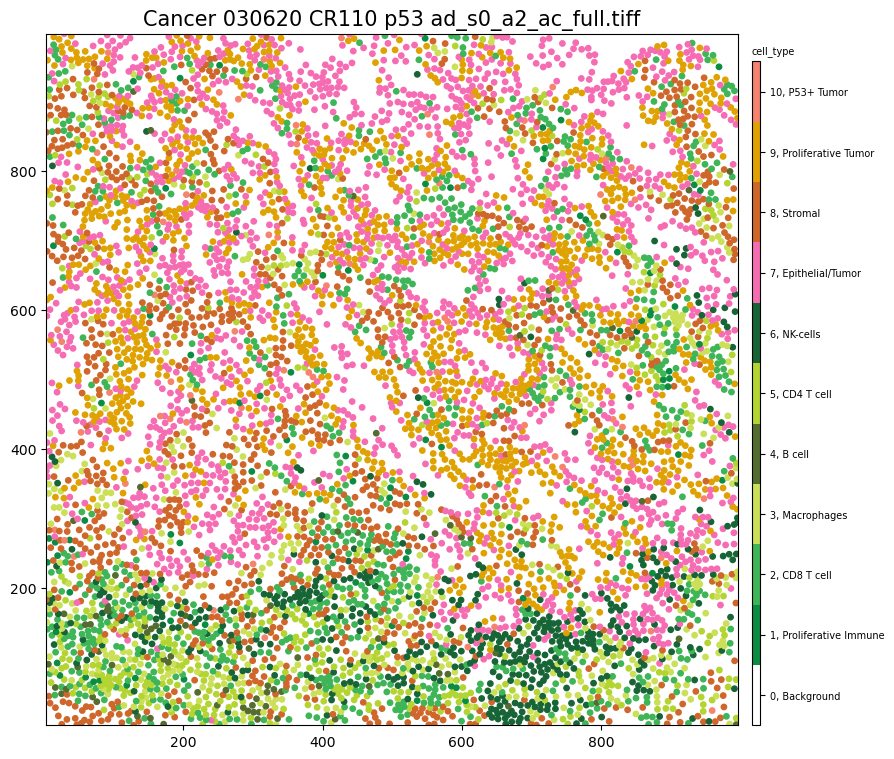

In [75]:
fig, axs = plt.subplots(1, 1, figsize=(9, 9), dpi=100)

custom_spatial(imc_so, 'Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff', 'cell_type', ax=axs, node_size=15)
# axs.legend(fontsize="x-large")


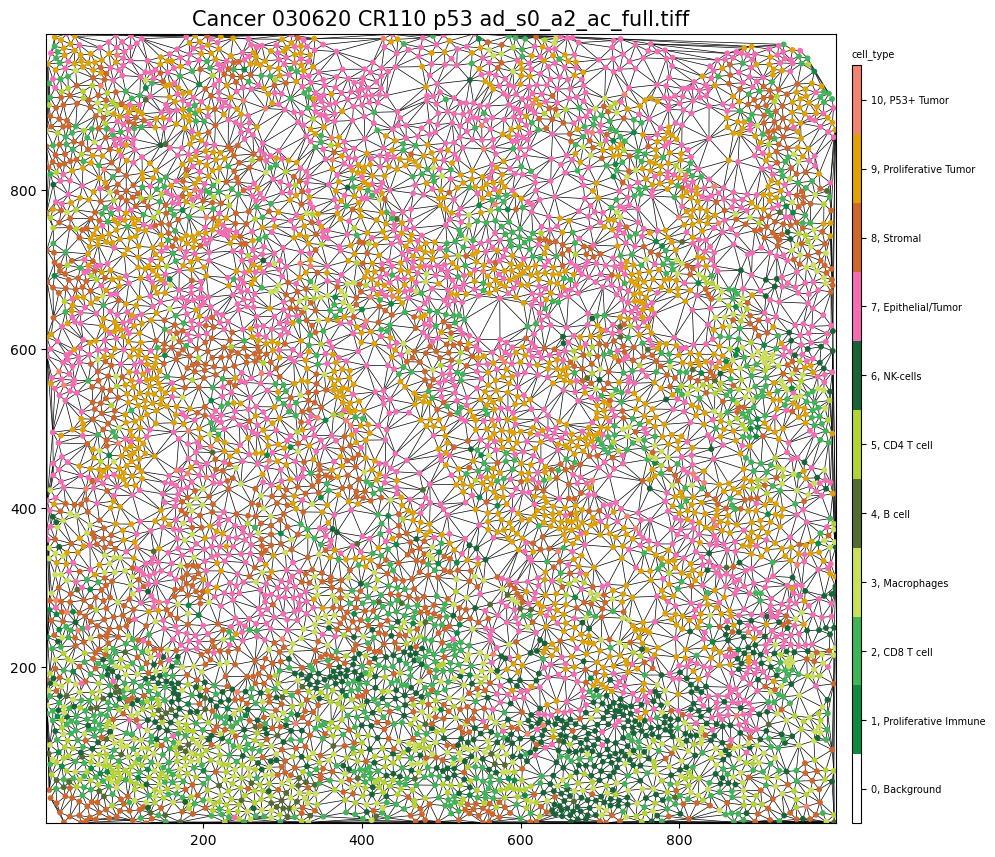

In [78]:
fig, axs = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
custom_spatial(imc_so, 'Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff', 'cell_type',
               node_size=10, edges=True, 
               graph_key='Delaunay', ax=axs, cbar=True)

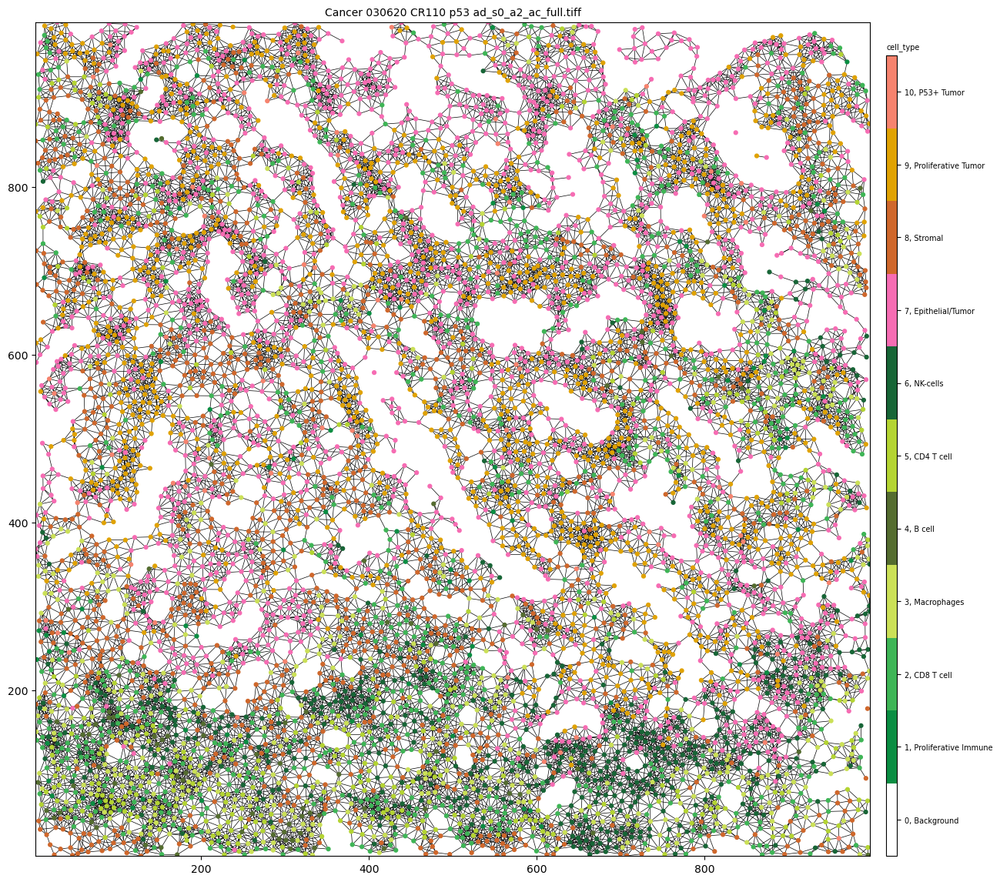

In [40]:
fig, axs = plt.subplots(1, 1, figsize=(13, 13), dpi=100)
custom_spatial(imc_so, 'Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff', 'cell_type',
               node_size=12, edges=True, 
               graph_key='radius', ax=axs, cbar=True)

In [79]:
# compute metrics at a sample level
for s in imc_so.obs.keys():
    ath.metrics.richness(imc_so, s, 'cell_type', local=False)
    ath.metrics.quadratic_entropy(imc_so, s, 'cell_type', local=False)

In [42]:
sample_level_metric = imc_so.spl.copy()
sample_level_metric

,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,5695,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.231775
Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,5193,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.257239
Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,8123,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,3.172803
Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,6368,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,3.669071
Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,7158,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,4.774507
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Normal CR084_s0_a4_ac_full.tiff,3161,Normal CR084_s0_a4_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN,10.0,4.904997
Normal CR084_s0_a5_ac_full.tiff,2974,Normal CR084_s0_a5_ac_full.tiff,CR084,Control,P05890,<5,NaN,treated,recur,NaN,NaN,10.0,4.597595
Normal CR202_s0_a1_ac_full.tiff,3466,Normal CR202_s0_a1_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO,10.0,3.769222


In [43]:
# imc_so.spl
msi_sample_level_metric = sample_level_metric[~sample_level_metric.MSI_any.isna()]
msi_sample_level_metric

,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,5695,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.231775
Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,5193,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.257239
Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,8123,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,3.172803
Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,6368,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,3.669071
Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,7158,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,4.774507
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cancer CR202_s0_a1_ac_full.tiff,6260,Cancer CR202_s0_a1_ac_full.tiff,CR202,Cancer,P06168,>5,NaN,none,no recur,True,NO,9.0,2.877216
Cancer CR202_s0_a2_ac_full.tiff,7434,Cancer CR202_s0_a2_ac_full.tiff,CR202,Cancer,P06168,>5,NaN,none,no recur,True,NO,10.0,3.247687
Normal CR202_s0_a1_ac_full.tiff,3466,Normal CR202_s0_a1_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO,10.0,3.769222


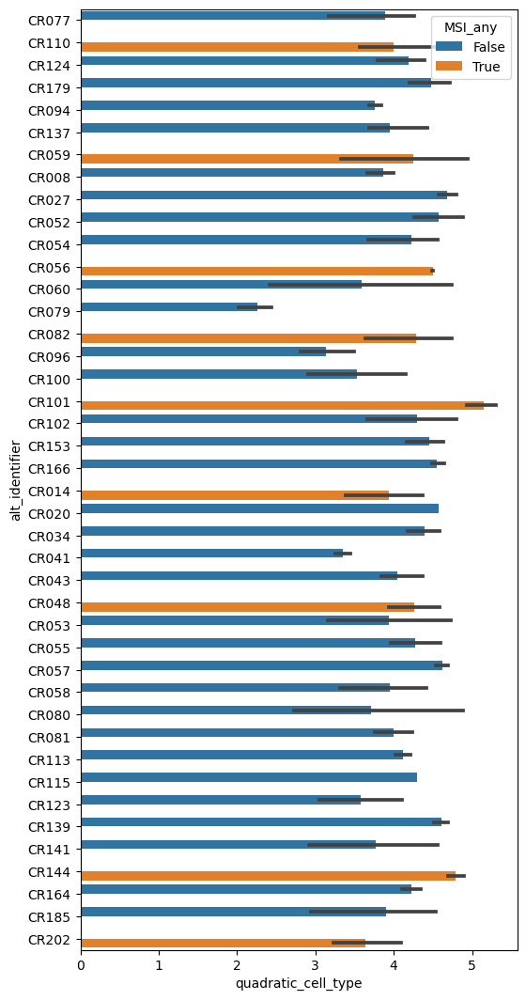

In [44]:
plt.subplots(figsize=(6, 13), dpi=100)
axs = sns.barplot(x='quadratic_cell_type',y='alt_identifier', hue='MSI_any',data=msi_sample_level_metric)

/scratch/tmp/pbs.1801746.delta2/ipykernel_13096/488190350.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs.set_xticklabels(axs.get_xticks(), size = 15)


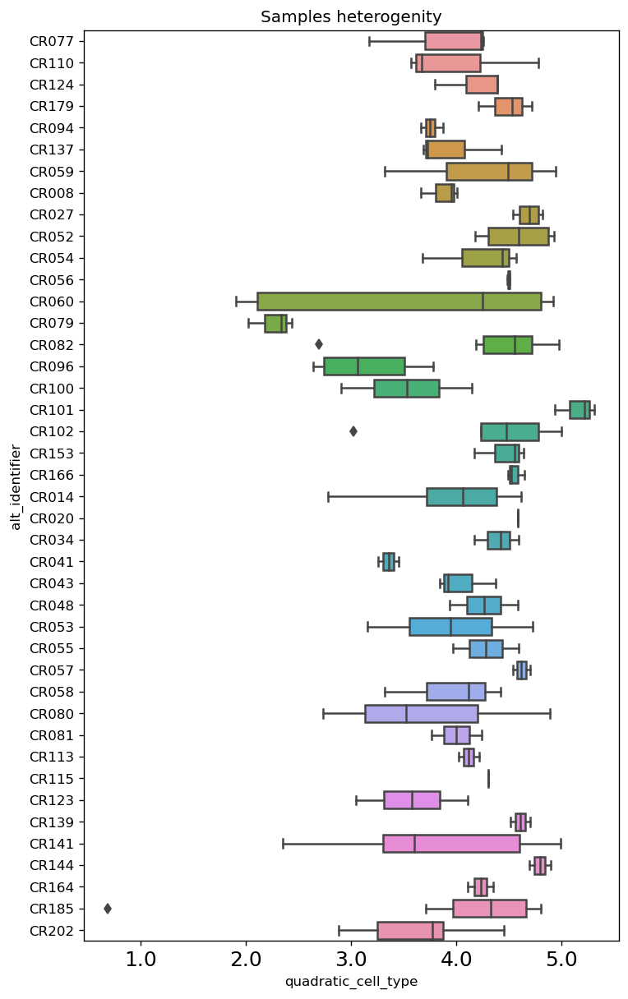

In [46]:
plt.subplots(figsize=(7, 12), dpi=120)
axs = sns.boxplot(x='quadratic_cell_type',y='alt_identifier', data=msi_sample_level_metric)
axs.set_title('Samples heterogenity')
axs.set_xticklabels(axs.get_xticks(), size = 15)
fig = axs.get_figure()
fig.savefig("IMC_het_Rao_Score.png") 

In [107]:
msi_sample_level_metric[msi_sample_level_metric['alt_identifier']=='CR079']


,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer 040220 CR079 p53 ad_s0_a1_ac_full.tiff,6249,Cancer 040220 CR079 p53 ad_s0_a1_ac_full.tiff,CR079,Cancer,P06033,<5,NaN,unknown,recur,False,YES,10.0,2.021965
Cancer 040220 CR079 p53 ad_s0_a2_ac_full.tiff,6589,Cancer 040220 CR079 p53 ad_s0_a2_ac_full.tiff,CR079,Cancer,P06033,<5,NaN,unknown,recur,False,YES,10.0,2.435486
Cancer 040220 CR079 p53 ad_s0_a3_ac_full.tiff,6050,Cancer 040220 CR079 p53 ad_s0_a3_ac_full.tiff,CR079,Cancer,P06033,<5,NaN,unknown,recur,False,YES,10.0,2.333853


In [47]:
msi_sample_level_metric[msi_sample_level_metric['alt_identifier']=='CR185']

,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer CR185_s0_a1_ac_full.tiff,1634,Cancer CR185_s0_a1_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,4.050146
Cancer CR185_s0_a2_ac_full.tiff,703,Cancer CR185_s0_a2_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,3.708939
Cancer CR185_s0_a3_ac_full.tiff,3482,Cancer CR185_s0_a3_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,4.196477
Cancer CR185_s0_a4_ac_full.tiff,1508,Cancer CR185_s0_a4_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,9.0,4.655265
Cancer CR185_s0_a5_ac_full.tiff,1866,Cancer CR185_s0_a5_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,4.683362
Cancer CR185_s0_a6_ac_full.tiff,2373,Cancer CR185_s0_a6_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,4.804067
Cancer CR185_s0_a7_ac_full.tiff,6094,Cancer CR185_s0_a7_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,10.0,4.452062
Cancer CR185_s0_a8_ac_full.tiff,943,Cancer CR185_s0_a8_ac_full.tiff,CR185,Cancer,P06158,>5,NaN,treated,recur,False,NO,8.0,0.689058


In [111]:
msi_sample_level_metric[msi_sample_level_metric['alt_identifier']=='CR101']

,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer 041420 CR101 p53 ad_s0_a1_ac_full.tiff,5904,Cancer 041420 CR101 p53 ad_s0_a1_ac_full.tiff,CR101,Cancer,P06047,<5,NaN,none,recur,True,NO,10.0,5.309148
Cancer 041420 CR101 p53 ad_s0_a2_ac_full.tiff,6744,Cancer 041420 CR101 p53 ad_s0_a2_ac_full.tiff,CR101,Cancer,P06047,<5,NaN,none,recur,True,NO,10.0,5.216543
Cancer 041420 CR101 p53 ad_s0_a3_ac_full.tiff,7316,Cancer 041420 CR101 p53 ad_s0_a3_ac_full.tiff,CR101,Cancer,P06047,<5,NaN,none,recur,True,NO,10.0,4.937171


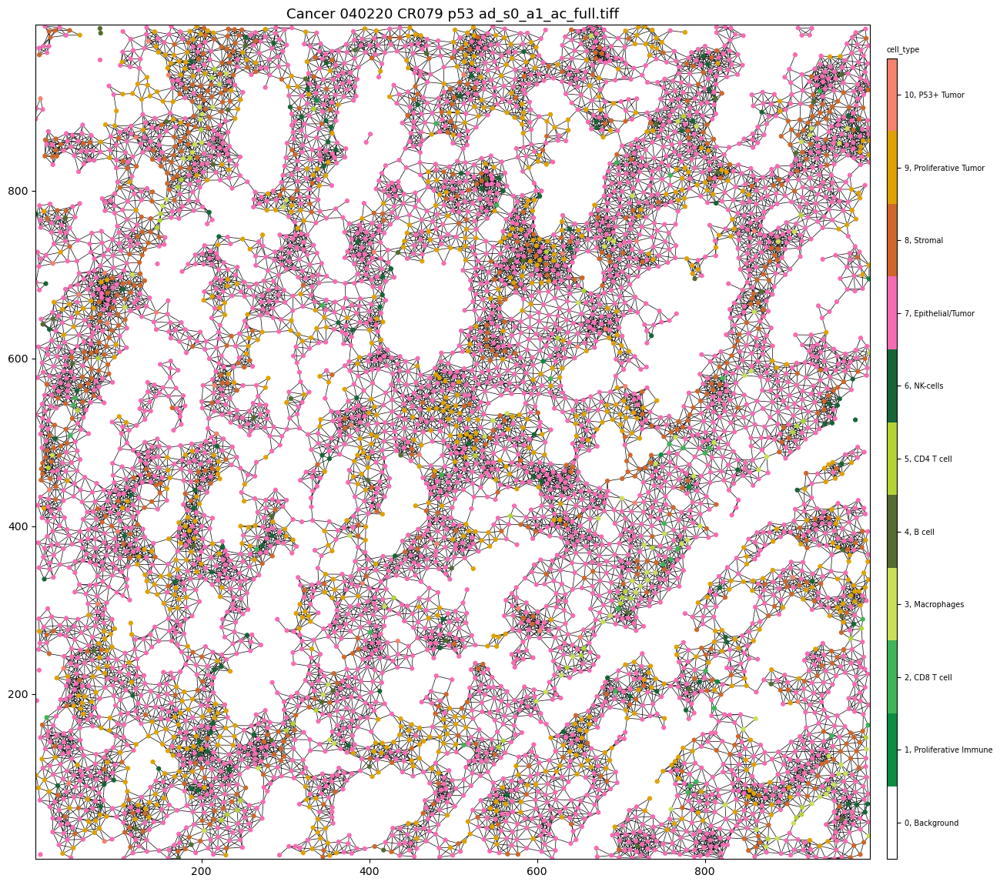

In [50]:
fig, axs = plt.subplots(1, 1, figsize=(13, 13), dpi=100)
custom_spatial(imc_so, 'Cancer 040220 CR079 p53 ad_s0_a1_ac_full.tiff', 'cell_type',
               node_size=12, edges=True, 
               graph_key='radius', ax=axs, cbar=True)

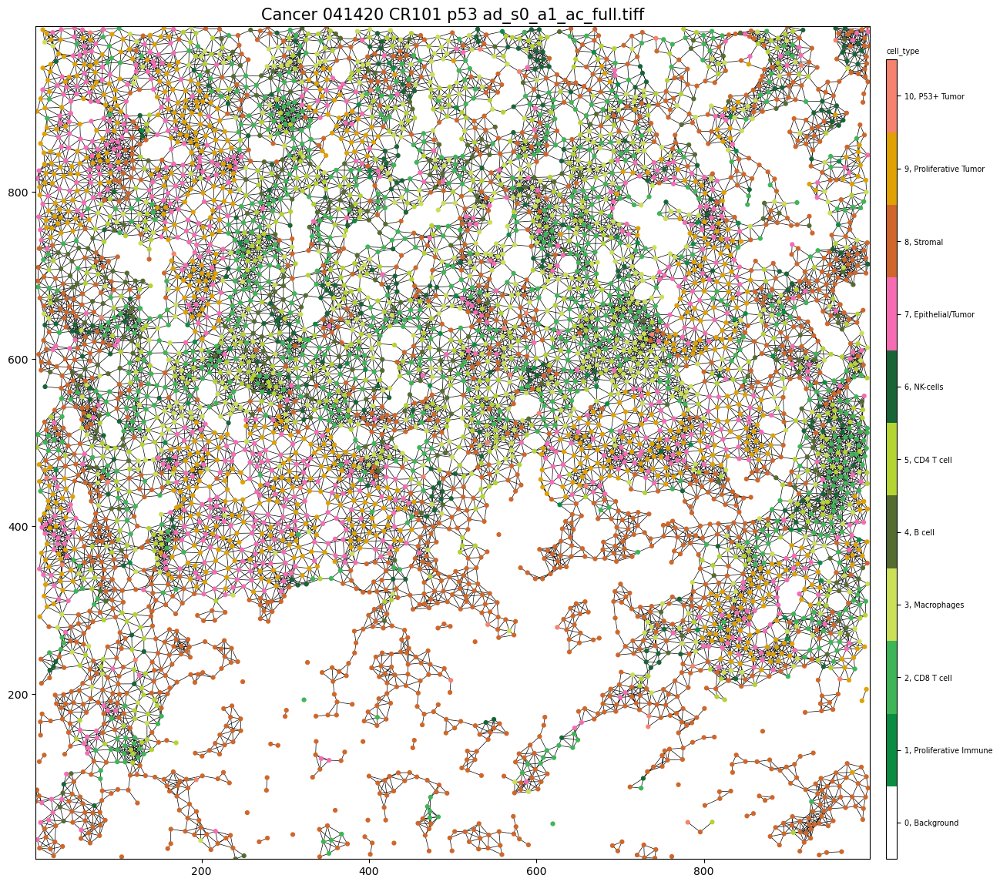

In [86]:
fig, axs = plt.subplots(1, 1, figsize=(13, 13), dpi=100)
custom_spatial(imc_so, 'Cancer 041420 CR101 p53 ad_s0_a1_ac_full.tiff', 'cell_type',
               node_size=12, edges=True, 
               graph_key='radius', ax=axs, cbar=True)

<bound method FigureBase.colorbar of <Figure size 900x900 with 1 Axes>>

In [29]:
for s in tqdm(imc_so.obs.keys()):
    ath.metrics.quadratic_entropy(imc_so, s, 'cell_type', local=True, graph_key='radius', key_added='het_radius')
#     ath.metrics.quadratic_entropy(imc_so, s, 'cell_type', local=True, graph_key='Delaunay', key_added='het_Delaunay')
    

  0%|                                                                                                                                         | 0/170 [00:00<?, ?it/s]


KeyError: 'Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff'

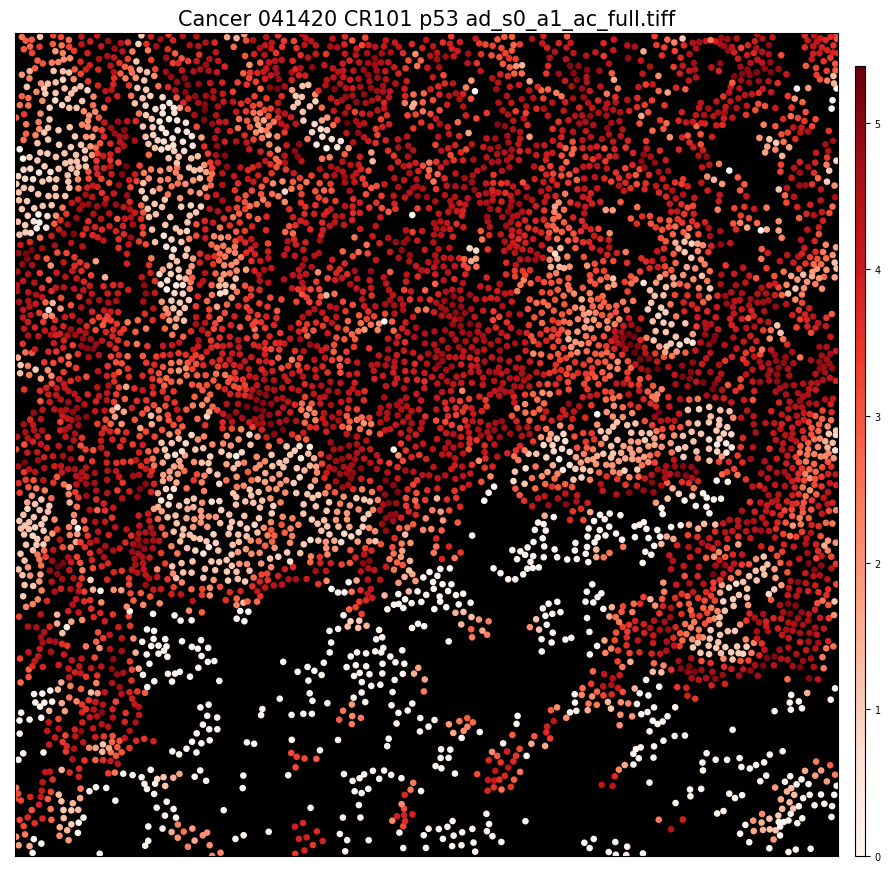

In [103]:
fig, axs = plt.subplots(1, 1, figsize=(9, 9), dpi=100)
custom_spatial(imc_so, 'Cancer 041420 CR101 p53 ad_s0_a1_ac_full.tiff',
               'het_radius', ax=axs, 
               node_size=14, cbar_title=False, background_color='black')
axs.set_xticks([])
axs.set_yticks([])

fig = axs.get_figure()
# fig.legend(loc=2, prop={'size': 15})
fig.tight_layout()
# cbar.set_label('Heterogenity score',size=28)
fig.savefig("IMC_high_het_ROI.png", ) 


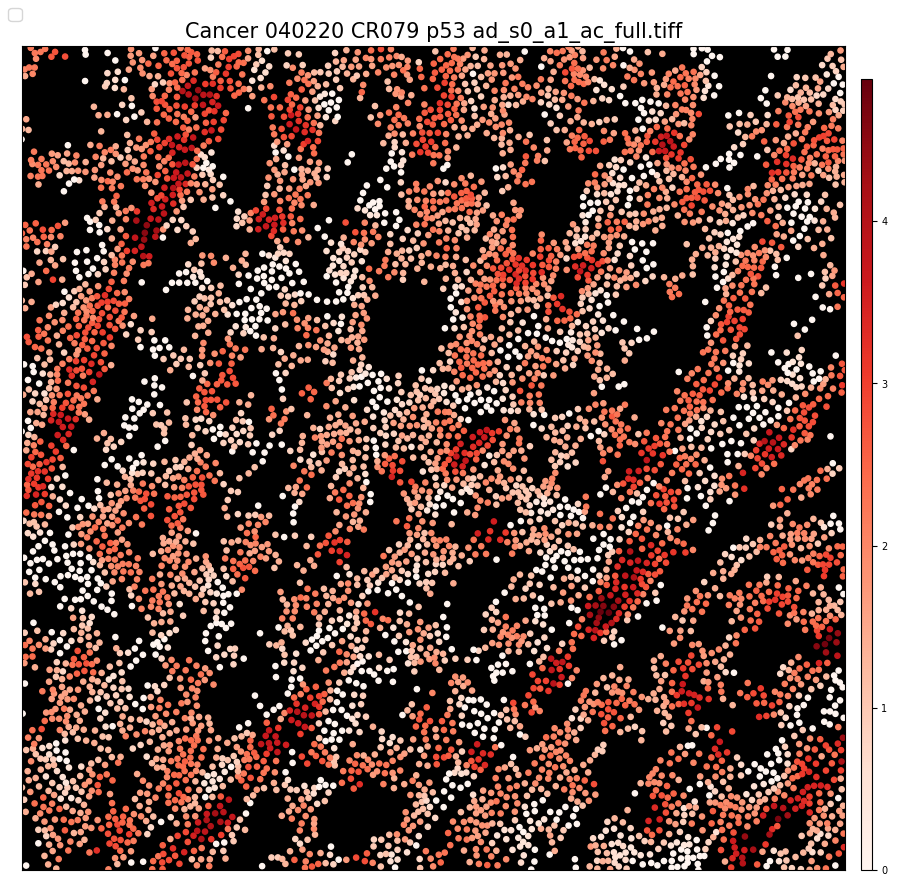

In [106]:
fig, axs = plt.subplots(1, 1, figsize=(9, 9), dpi=100)
custom_spatial(imc_so, 'Cancer 040220 CR079 p53 ad_s0_a1_ac_full.tiff', 'het_radius',
               node_size=14, edges=False,
               graph_key='radius', ax=axs, cbar_title=False, background_color='black')
axs.set_xticks([])
axs.set_yticks([])
fig = axs.get_figure()
fig.legend(loc=2, prop={'size': 12})
fig.tight_layout()
fig.savefig("IMC_low_het_ROI.png") 

In [108]:
msi_sample_level_metric

,cell_count,Metadata,alt_identifier,batch,Patient ID,5YearSurvival,Exclude,Treatment,Reccurrance,MSI_any,CHR_17P_DEL,richness_cell_type,quadratic_cell_type
sample,,,,,,,,,,,,,
Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,5695,Cancer 030520 ad 24 p53_s0_a1_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.231775
Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,5193,Cancer 030520 ad 24 p53_s0_a2_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,4.257239
Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,8123,Cancer 030520 ad 24 p53_s0_a3_ac_full.tiff,CR077,Cancer,P06032,<5,NaN,treated,recur,False,YES,10.0,3.172803
Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,6368,Cancer 030620 CR110 p53 ad_s0_a1_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,3.669071
Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,7158,Cancer 030620 CR110 p53 ad_s0_a2_ac_full.tiff,CR110,Cancer,P06052,>5,NaN,unknown,unk - no FU,True,NO,10.0,4.774507
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cancer CR202_s0_a1_ac_full.tiff,6260,Cancer CR202_s0_a1_ac_full.tiff,CR202,Cancer,P06168,>5,NaN,none,no recur,True,NO,9.0,2.877216
Cancer CR202_s0_a2_ac_full.tiff,7434,Cancer CR202_s0_a2_ac_full.tiff,CR202,Cancer,P06168,>5,NaN,none,no recur,True,NO,10.0,3.247687
Normal CR202_s0_a1_ac_full.tiff,3466,Normal CR202_s0_a1_ac_full.tiff,CR202,Control,P06168,>5,NaN,none,no recur,True,NO,10.0,3.769222


In [115]:
msi_sample_level_metric['5YearSurvival'].unique()

array(['<5', '>5'], dtype=object)

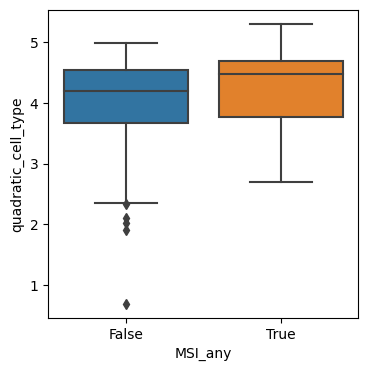

In [148]:
plt.subplots(figsize=(4, 4), dpi=100)
axs = sns.boxplot(x='MSI_any',y='quadratic_cell_type',data=msi_sample_level_metric)

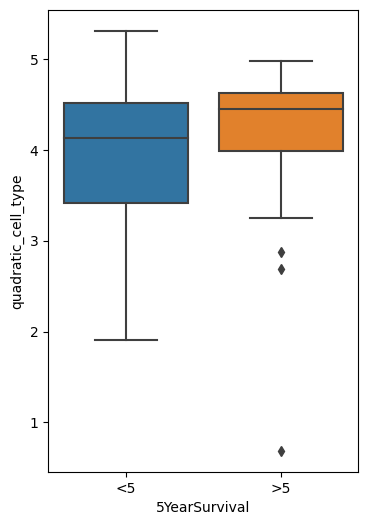

In [149]:
plt.subplots(figsize=(4, 6), dpi=100)
axs = sns.boxplot(x='5YearSurvival',y='quadratic_cell_type',data=msi_sample_level_metric)

In [138]:
import scipy.stats as stats

In [118]:
long_sur = msi_sample_level_metric[msi_sample_level_metric['5YearSurvival']=='>5']
short_sur = msi_sample_level_metric[msi_sample_level_metric['5YearSurvival']=='<5']


In [121]:
long_sur.quadratic_cell_type.values

array([3.66907122, 4.77450716, 3.56550961, 4.38986193, 3.79104666,
       4.39008314, 4.20508562, 4.53028848, 4.71282998, 4.53633713,
       4.61753191, 4.76195951, 4.81539424, 4.56475541, 4.4324431 ,
       3.67707171, 4.74654026, 4.1819794 , 2.69035469, 4.97271149,
       4.48723016, 4.62172466, 4.63361175, 4.16812829, 4.55256691,
       4.64554379, 4.51779375, 4.48961487, 3.93720127, 4.58222194,
       3.96338487, 4.59234586, 4.01705071, 4.2127116 , 4.51532459,
       4.69883892, 4.34603425, 4.11004457, 4.05014588, 3.70893923,
       4.19647746, 4.65526468, 4.68336155, 4.80406701, 4.45206216,
       0.689058  , 2.87721617, 3.24768664, 3.76922189, 3.87489713,
       4.44622609])

In [139]:
stat, pval = stats.ttest_ind(a=list(long_sur.quadratic_cell_type.values), 
                             b=list(short_sur.quadratic_cell_type.values))
#     list_pair_values.append(pair)
#     pvals.append(pval)
stat, pval 

(2.000272069560189, 0.04750730481078434)

In [154]:
stats.mannwhitneyu(list(long_sur.quadratic_cell_type.values), list(short_sur.quadratic_cell_type.values))

MannwhitneyuResult(statistic=2619.0, pvalue=0.030578420056537645)

In [150]:
msi_true = msi_sample_level_metric[msi_sample_level_metric['MSI_any']==True]
msi_false = msi_sample_level_metric[msi_sample_level_metric['MSI_any']==False]


In [151]:
stats.ttest_ind(a=list(long_sur.quadratic_cell_type.values), b=list(short_sur.quadratic_cell_type.values))


Ttest_indResult(statistic=2.000272069560189, pvalue=0.04750730481078434)

In [ ]:
stats.mannwhitneyu(list(long_sur.quadratic_cell_type.values), list(short_sur.quadratic_cell_type.values))